<a href="https://colab.research.google.com/github/rhenerose/COVID-2019_Dataset_Visualize/blob/master/SIGNATE_COVID_2019_Dataset_Visualize.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SIGNATE COVID-2019 Dataset Visualize
referenced:  
https://signate.jp/competitions/261/discussions/20200401171320-59

## install japanese font for matplotlib
at first, run this section and 'RESTART THIS RUNTIME'.


In [1]:
# !sudo apt -y install fonts-noto-cjk
!sudo apt -y install fonts-ipafont-gothic
!rm /root/.cache/matplotlib/fontlist-v310.json

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  fonts-ipafont-mincho
The following NEW packages will be installed:
  fonts-ipafont-gothic fonts-ipafont-mincho
0 upgraded, 2 newly installed, 0 to remove and 25 not upgraded.
Need to get 8,251 kB of archives.
After this operation, 28.7 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fonts-ipafont-gothic all 00303-18ubuntu1 [3,526 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fonts-ipafont-mincho all 00303-18ubuntu1 [4,725 kB]
Fetched 8,251 kB in 1s (6,523 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 2.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
de

### restart this runtime
please ignore, when you will see the crash log.  
and wait few seconds before run the next cell.


In [0]:
import os
os.kill(os.getpid(), 9)

## download 'SIGNATE COVID-2019 Dataset'
please show this link  
<https://signate.jp/competitions/261#misc>
(japanese)


In [1]:
!wget --no-check-certificate --output-document=covid_19.csv 'https://docs.google.com/spreadsheets/d/1CnQOf6eN18Kw5Q6ScE_9tFoyddk4FBwFZqZpt_tMOm4/export?gid=0&format=csv'

--2020-04-05 23:13:35--  https://docs.google.com/spreadsheets/d/1CnQOf6eN18Kw5Q6ScE_9tFoyddk4FBwFZqZpt_tMOm4/export?gid=0&format=csv
Resolving docs.google.com (docs.google.com)... 209.85.145.138, 209.85.145.113, 209.85.145.101, ...
Connecting to docs.google.com (docs.google.com)|209.85.145.138|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘covid_19.csv’

covid_19.csv            [ <=>                ]   1.46M  --.-KB/s    in 0.09s   

2020-04-05 23:14:16 (15.9 MB/s) - ‘covid_19.csv’ saved [1536650]



### install gspread (not use this time)

In [0]:
# # install gspread
# !pip install --upgrade -q gspread

In [0]:
# from google.colab import auth
# auth.authenticate_user()

# import gspread
# from oauth2client.client import GoogleCredentials

# gc = gspread.authorize(GoogleCredentials.get_application_default())

# workbook = gc.open_by_url('https://docs.google.com/spreadsheets/d/1CnQOf6eN18Kw5Q6ScE_9tFoyddk4FBwFZqZpt_tMOm4/')


In [0]:
# # get '罹患者' worksheet
# ws = workbook.worksheet('罹患者')
# # get_all_values gives a list of rows.
# rows = ws.get_all_values()
# len(rows)

In [0]:
# # show first row (may be data header)
# rows[0]

In [0]:
# # Convert to a DataFrame and render.
# import pandas as pd
# df_origin = pd.DataFrame.from_records(rows[1:])   # data body
# df_origin.columns = rows[0]                       # data header
# df_origin.head()

## main code

### import library

In [0]:
import pandas as pd
import numpy as np
import datetime

In [7]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import seaborn as sns
# matplotlib use japanese font setting
sns.set(font='IPAPGothic', style='white')
matplotlib.rcParams['font.family'] = 'IPAPGothic'
# matplotlib.rcParams['font.sans-serif'] = ['Hiragino Maru Gothic Pro', 'Yu Gothic', 'Meirio', 'Takao', 'IPAexGothic', 'IPAPGothic', 'VL PGothic', 'Noto Sans CJK JP']
matplotlib.font_manager._rebuild()


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### set constant variable

In [0]:
pref_area = {
    "北海道":"北海道",
    "青森県":"東北",
    "岩手県":"東北",
    "宮城県":"東北",
    "秋田県":"東北",
    "山形県":"東北",
    "福島県":"東北",
    "茨城県":"北関東・甲信",
    "栃木県":"北関東・甲信",
    "群馬県":"北関東・甲信",
    "埼玉県":"南関東",
    "千葉県":"南関東",
    "東京都":"南関東",
    "神奈川県":"南関東",
    "新潟県":"北陸",
    "富山県":"北陸",
    "石川県":"北陸",
    "福井県":"北陸",
    "山梨県":"北関東・甲信",
    "長野県":"北関東・甲信",
    "岐阜県":"東海",
    "静岡県":"東海",
    "愛知県":"東海",
    "三重県":"東海",
    "滋賀県":"近畿",
    "京都府":"近畿",
    "大阪府":"近畿",
    "兵庫県":"近畿",
    "奈良県":"近畿",
    "和歌山県":"近畿",
    "鳥取県":"中国",
    "島根県":"中国",
    "岡山県":"中国",
    "広島県":"中国",
    "山口県":"中国",
    "徳島県":"四国",
    "香川県":"四国",
    "愛媛県":"四国",
    "高知県":"四国",
    "福岡県":"九州",
    "佐賀県":"九州",
    "長崎県":"九州",
    "熊本県":"九州",
    "大分県":"九州",
    "宮崎県":"九州",
    "鹿児島県":"九州",
    "沖縄県":"九州"
}

colors = {
    "北海道":'#7db0dd',
    "東北":'#8bade0',
    "北陸":'#99a9e2',
    "北関東・甲信":'#a6a6e2',
    "南関東":'#b1a2e1',
    "東海":'#c59cdc',
    "近畿":'#d497d3',
    "中国":'#de94c6',
    "四国":'#e393b6',
    "九州":'#e495a5'
}

### read 'SIGNATE COVID-2019 Dataset'

In [9]:
df_origin = pd.read_csv('covid_19.csv')
df_origin.head()

,罹患者id,都道府県コード,都道府県別罹患者No,症状・経過,行動歴,医療従事者ﾌﾗｸﾞ,基礎疾患ﾌﾗｸﾞ,公表日,ステータス,受診都道府県,受診都道府県緯度,受診都道府県経度,居住地,居住地緯度,居住地経度,年代,性別,職業,海外渡航歴ﾌﾗｸﾞ,海外渡航先,帰国日,ﾀﾞｲﾔﾓﾝﾄﾞﾌﾟﾘﾝｾｽ号乗船ﾌﾗｸﾞ,濃厚接触者状況,情報源,idチェック済ﾌﾗｸﾞ,idチェック日,id不備有りﾌﾗｸﾞ
0,1-1,1.0,1,1月21日に来日し、22日より北海道を観光。\n1月26日 体調不良のため外出せず。夜間に咳...,海外渡航歴なし。濃厚接触者は、現時点で家族、同僚等43名を特定し、健康観察実施中。,NaN,NaN,2020/01/28,0.0,北海道,43.06417,141.34694,中国（武漢市）,30.596269,114.311361,40 - 49,女性,NaN,1,中国,2020/01/21,0.0,濃厚接触者を特定し\n健康観察終了,http://www.pref.hokkaido.lg.jp/hf/kth/kak/hass...,1.0,2020/04/03,0.0
1,1-2,1.0,2,1月31日 発熱、咳、倦怠感が出現。\n2月 3日 石狩振興局管内の医療機関Aを受診。\n2...,NaN,NaN,NaN,2020/02/14,0.0,北海道,43.06417,141.34694,札幌市,43.062245,141.354673,50 - 59,男性,自営業,0,-,-,0.0,健康観察実施中,http://www.pref.hokkaido.lg.jp/hf/kth/kak/hass...,1.0,2020/04/03,0.0
2,1-3,1.0,3,2月 8日 倦怠感、筋肉痛、関節痛が出現\n2月12日 発熱、咳が出現\n2月13日 札幌市...,2月1日から2月12日までの期間、No.5の男性（2月19日感染判明）とともに、雪まつり大通...,NaN,NaN,2020/02/19,0.0,北海道,43.06417,141.34694,札幌市,43.062245,141.354673,40 - 49,男性,会社員,0,-,-,0.0,札幌市公表中\nid:1-5,http://www.pref.hokkaido.lg.jp/hf/kth/kak/hass...,1.0,2020/04/03,0.0
3,1-4,1.0,4,2月 3日 微熱、咽頭痛。\n2月 7日 渡島総合振興局管内の医療機関Aを受診。\n2月13...,本人からの申告によれば、海外渡航歴は無し。\n濃厚接触者48名について保健所が健康観察を行う...,NaN,NaN,2020/02/19,0.0,北海道,43.06417,141.34694,渡島総合振興局管内（七飯町）,41.895907,140.694947,60 - 69,男性,議会議員,0,-,-,0.0,濃厚接触者を特定し健康観察終了\nid:1-12,http://www.pref.hokkaido.lg.jp/hf/kth/kak/hass...,1.0,2020/04/03,0.0
4,1-5,1.0,5,2月15日 悪寒、発汗、倦怠感、筋肉痛、関節痛が出現。\n2月18日 発熱、筋肉痛、咳、痰が...,2月1日から2月12日までの期間、id:1-3の男性（2月18日感染判明）とともに、雪まつり...,NaN,NaN,2020/02/20,0.0,北海道,43.06417,141.34694,札幌市,43.062245,141.354673,40 - 49,男性,会社員,0,-,-,0.0,札幌市公表中\nid:1-3,http://www.pref.hokkaido.lg.jp/hf/kth/kak/hass...,1.0,2020/04/03,0.0


In [10]:
df_origin.shape

(2871, 27)

In [11]:
# choose use columns
df = df_origin.loc[:, ['公表日', '受診都道府県']]

# remove NaN recode
df.dropna(how='any', inplace=True)

# '公表日' valuse cast to datetime64
df['公表日'] = pd.to_datetime(df['公表日'], format='%Y/%m/%d')
# '受診都道府県' values convet to One-hot-encoding
df = pd.concat([df, pd.get_dummies(df['受診都道府県'])], axis=1)

# set index
df.set_index('公表日', inplace=True)

# remove unnecessary columns
# df.drop(columns=['', '大学職員'], inplace=True)
df.drop(columns=['大学職員'], inplace=True)

df.tail()

,受診都道府県,三重県,京都府,佐賀県,兵庫県,北海道,千葉県,和歌山県,埼玉県,大分県,大阪府,奈良県,宮城県,宮崎県,富山県,山口県,山形県,山梨県,岐阜県,岡山県,広島県,徳島県,愛媛県,愛知県,新潟県,東京都,栃木県,沖縄県,滋賀県,熊本県,石川県,神奈川県,福井県,福岡県,福島県,秋田県,群馬県,茨城県,長崎県,長野県,青森県,静岡県,香川県,高知県,鹿児島県
公表日,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-03-24,沖縄県,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-03-26,沖縄県,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-03-28,沖縄県,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-03-28,沖縄県,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-03-30,沖縄県,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [12]:
# summary daily patient count
df_count = df.resample('D').sum()
df_count.tail()

,三重県,京都府,佐賀県,兵庫県,北海道,千葉県,和歌山県,埼玉県,大分県,大阪府,奈良県,宮城県,宮崎県,富山県,山口県,山形県,山梨県,岐阜県,岡山県,広島県,徳島県,愛媛県,愛知県,新潟県,東京都,栃木県,沖縄県,滋賀県,熊本県,石川県,神奈川県,福井県,福岡県,福島県,秋田県,群馬県,茨城県,長崎県,長野県,青森県,静岡県,香川県,高知県,鹿児島県
公表日,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-01,1,0,1,14,5,1,0,5,0,34,4,4,0,2,0,1,0,5,1,0,0,0,5,0,66,3,0,0,1,2,19,2,32,2,1,0,18,3,0,0,0,0,3,1
2020-04-02,1,0,0,7,3,0,0,16,1,33,4,1,0,4,0,1,1,5,2,4,0,2,0,0,97,0,0,1,0,0,11,8,22,2,0,0,2,3,0,1,0,0,1,1
2020-04-03,0,0,0,0,5,0,0,18,0,35,2,6,0,0,0,0,3,4,0,0,0,0,0,0,0,0,0,6,0,0,0,12,19,1,0,0,10,0,0,2,0,0,2,0
2020-04-04,0,0,0,0,0,0,0,24,0,41,3,1,0,0,0,0,2,7,0,0,0,0,0,0,0,0,0,3,0,0,0,4,27,5,0,0,5,0,0,0,0,0,3,0
2020-04-05,0,0,0,0,0,0,0,2,0,21,1,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,16,0,0,0,0,0,0,0,0,0,7,0


In [13]:
# summary daily patient total count
df_cumsum = df_count.cumsum()
df_cumsum.tail()

,三重県,京都府,佐賀県,兵庫県,北海道,千葉県,和歌山県,埼玉県,大分県,大阪府,奈良県,宮城県,宮崎県,富山県,山口県,山形県,山梨県,岐阜県,岡山県,広島県,徳島県,愛媛県,愛知県,新潟県,東京都,栃木県,沖縄県,滋賀県,熊本県,石川県,神奈川県,福井県,福岡県,福島県,秋田県,群馬県,茨城県,長崎県,長野県,青森県,静岡県,香川県,高知県,鹿児島県
公表日,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-01,13,56,3,162,183,125,18,101,29,278,15,12,3,4,5,2,5,32,5,6,3,9,183,31,588,17,10,7,15,14,161,22,78,6,7,20,41,5,7,8,8,2,20,2
2020-04-02,14,56,3,169,186,125,18,117,30,311,19,13,3,8,5,3,6,37,7,10,3,11,183,31,685,17,10,8,15,14,172,30,100,8,7,20,43,8,7,9,8,2,21,3
2020-04-03,14,56,3,169,191,125,18,135,30,346,21,19,3,8,5,3,9,41,7,10,3,11,183,31,685,17,10,14,15,14,172,42,119,9,7,20,53,8,7,11,8,2,23,3
2020-04-04,14,56,3,169,191,125,18,159,30,387,24,20,3,8,5,3,11,48,7,10,3,11,183,31,685,17,10,17,15,14,172,46,146,14,7,20,58,8,7,11,8,2,26,3
2020-04-05,14,56,3,169,191,125,18,161,30,408,25,20,3,8,5,3,14,48,7,10,3,11,183,31,685,17,10,17,15,14,172,46,162,14,7,20,58,8,7,11,8,2,33,3


In [14]:
# ex.) get record of '2020-04-01'
df_cumsum[df_cumsum.index == pd.to_datetime(datetime.date(2020, 4, 1))]

,三重県,京都府,佐賀県,兵庫県,北海道,千葉県,和歌山県,埼玉県,大分県,大阪府,奈良県,宮城県,宮崎県,富山県,山口県,山形県,山梨県,岐阜県,岡山県,広島県,徳島県,愛媛県,愛知県,新潟県,東京都,栃木県,沖縄県,滋賀県,熊本県,石川県,神奈川県,福井県,福岡県,福島県,秋田県,群馬県,茨城県,長崎県,長野県,青森県,静岡県,香川県,高知県,鹿児島県
公表日,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-01,13,56,3,162,183,125,18,101,29,278,15,12,3,4,5,2,5,32,5,6,3,9,183,31,588,17,10,7,15,14,161,22,78,6,7,20,41,5,7,8,8,2,20,2


In [15]:
# ex.) get series data of '2020-4-1' (TOP10)
df_cumsum[df_cumsum.index == pd.to_datetime(datetime.date(2020, 4, 1))].iloc[0].sort_values(ascending=True)[-10:]

京都府      56
福岡県      78
埼玉県     101
千葉県     125
神奈川県    161
兵庫県     162
北海道     183
愛知県     183
大阪府     278
東京都     588
Name: 2020-04-01 00:00:00, dtype: uint64

### Bar Chart Race Draw Function

In [0]:
# Bar Chart Race Draw Function
def draw_barchart(date, top=10):
    dateData = df_cumsum[df_cumsum.index == pd.to_datetime(date)]

    # check exist record
    if len(dateData) == 0:
        # not exist
        print('no data!!')
        return
    elif len(dateData.columns) < top:
      top = len(dateData.columns)

    # get series data (top N)
    data = dateData.iloc[0].sort_values(ascending=True)[-top:]

    # draw chart
    # fig, ax = plt.subplots(figsize=(15, 8))
    ax.clear()
    ax.barh(data.index, data.values, color=[colors[pref_area[x]] for x in data.index])
    
    # draw series label
    for i, (name, value) in enumerate(zip(data.index, data.values)):
        area = pref_area[name]
        ax.text(value, i, name, size=14, weight=600, ha='right', va='bottom')
        ax.text(value, i-.25, area, size=10, color='#444444', ha='right', va='baseline')
        ax.text(value, i, value, size=14, ha='left',  va='bottom')

    ax.text(1, 0.4, data.name.date(), transform=ax.transAxes,color='#777777', size=38, ha='right', weight=800)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    plt.box(False)

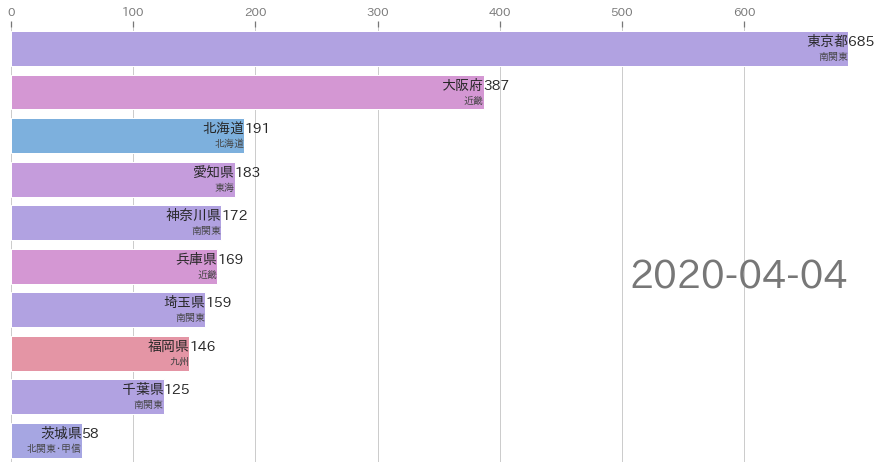

In [17]:
# ex.）total patient at 2020-04-04
fig, ax = plt.subplots(figsize=(15, 8))
draw_barchart(datetime.date(2020, 4, 4), top=10)

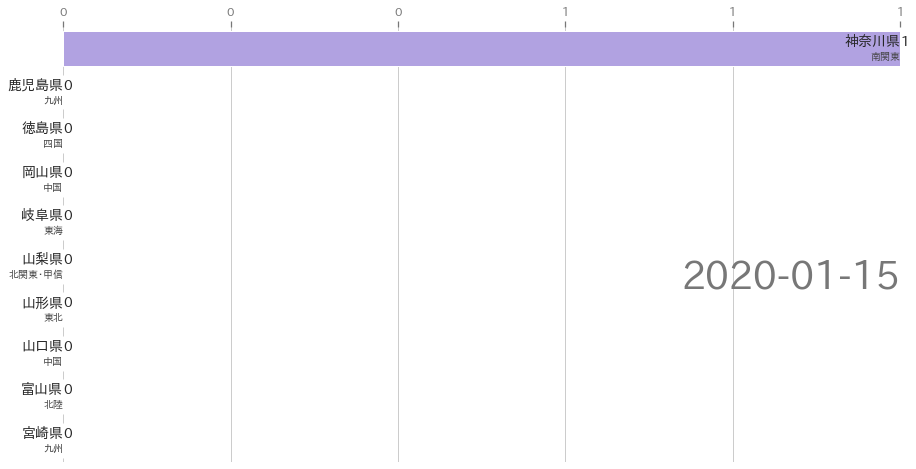

In [18]:
# make total patient bar chart race animation
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, interval = 250, repeat=False, frames=df_cumsum.index)

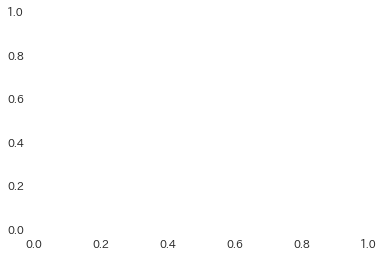

In [19]:
# visualize animation
from matplotlib import rc
rc('animation', html='jshtml')
animator

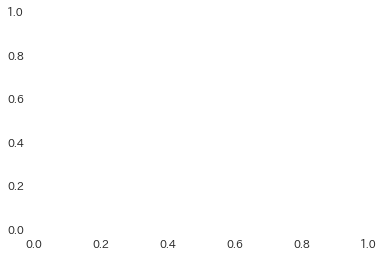

In [20]:
# save animation (to GIF Animation file)
from matplotlib.animation import PillowWriter
animator.save("bar_chart_race.gif", writer=PillowWriter(fps=4))

## display saved gif file

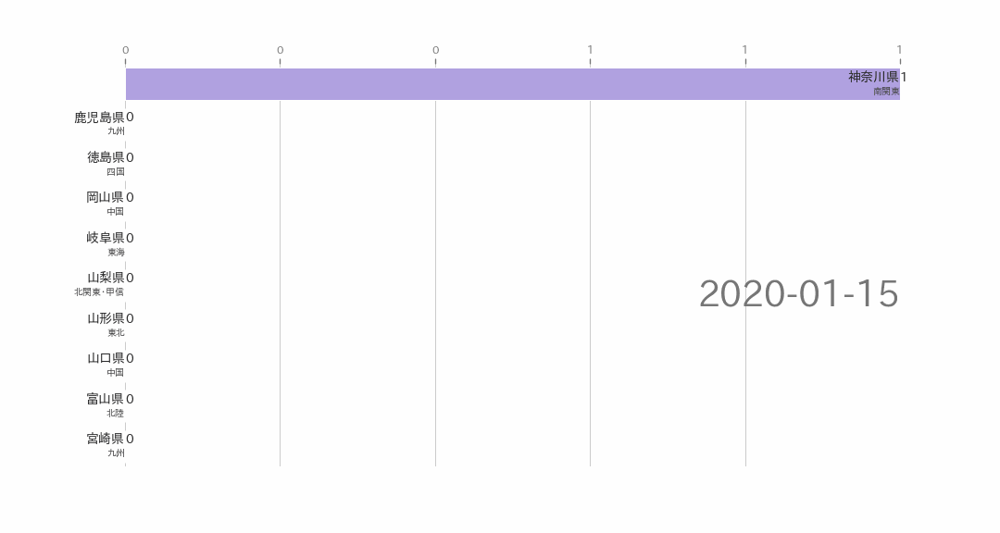

In [21]:
import IPython.display
with open('./bar_chart_race.gif','rb') as f:
    display(IPython.display.Image(data=f.read(), format='png'))

In [22]:
df_cumsum.index[-1]

Timestamp('2020-04-05 00:00:00', freq='D')

## Get last top10 prefecture

In [0]:
lastTop10_prefecture = df_cumsum[df_cumsum.index == df_cumsum.index[-1]].iloc[0].sort_values(ascending=False)[:10].index.values

In [24]:
df_cumsum.loc[:, lastTop10_prefecture].tail()

,東京都,大阪府,北海道,愛知県,神奈川県,兵庫県,福岡県,埼玉県,千葉県,茨城県
公表日,,,,,,,,,,
2020-04-01,588,278,183,183,161,162,78,101,125,41
2020-04-02,685,311,186,183,172,169,100,117,125,43
2020-04-03,685,346,191,183,172,169,119,135,125,53
2020-04-04,685,387,191,183,172,169,146,159,125,58
2020-04-05,685,408,191,183,172,169,162,161,125,58


## Draw logarithmic chart


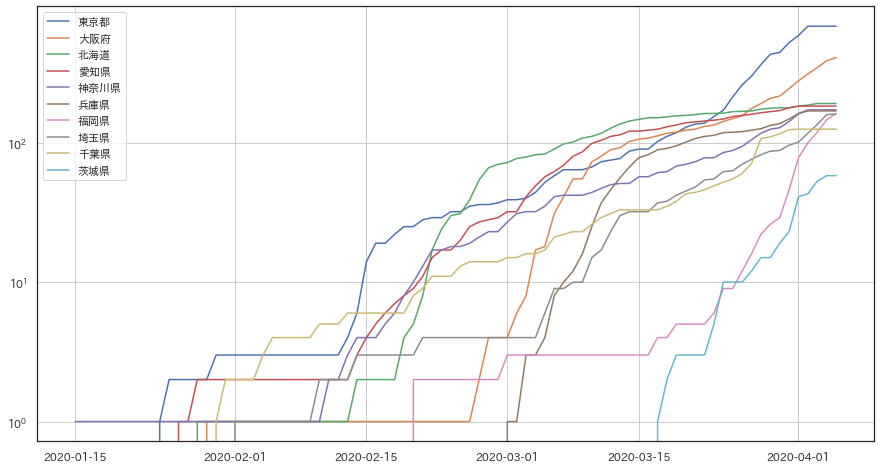

In [25]:
fig, ax = plt.subplots(figsize=(15, 8))
for col in lastTop10_prefecture:
    plt.plot(df_cumsum.index, df_cumsum.loc[:, col].values, label=col)
ax.set_yscale('log')  # axis y 'log' scale
ax.grid(which='major', axis='y', linestyle='-')
ax.grid(which='major', axis='x', linestyle='-')
plt.legend(loc='best')

plt.show()

## visualize map

In [0]:
import folium
from folium.plugins import HeatMap

In [0]:
# set map center (nagoya city office) and scale size
map = folium.Map(location=[35.1814552, 136.9045057], zoom_start=7)

In [79]:
df_loc = df_origin.loc[:, ['公表日', '居住地緯度', '居住地経度']].dropna()
df_loc.head()

,公表日,居住地緯度,居住地経度
0,2020/01/28,30.596269,114.311361
1,2020/02/14,43.062245,141.354673
2,2020/02/19,43.062245,141.354673
3,2020/02/19,41.895907,140.694947
4,2020/02/20,43.062245,141.354673


In [80]:
# add heatmap
HeatMap(df_loc.loc[:, ['居住地緯度', '居住地経度']].values, radius=10, blur=5).add_to(map)

In [82]:
map